# Fit a PSF on transverse profile
==================================================================================================

- author : Sylvie
- creation date   : November 7th 2017
- Version : 0.0


The goal of this notebook is to fit a PSF on transverse profile



#### problem because limitation in output of data

- firt I tried to generate a config file for jupyter

If you ran jupyter notebook --generate-config to create it, it should be in the correct place already. If not, try putting it at ~/.jupyter/jupyter_notebook_config.py

- and I set : 
> c.NotebookApp.iopub_data_rate_limit = 1000000

but it failed again so I launch jupyter as follow:

> jupyter notebook --NotebookApp.iopub_data_rate_limit=10000000 Ana2DShapeSpectra.ipynb

So it behaves better

In [2]:
%%javascript
var kernel = IPython.notebook.kernel;
var thename = window.document.getElementById("notebook_name").innerHTML;
var command = "theNotebook = " + "'"+thename+"'";
kernel.execute(command);

<IPython.core.display.Javascript object>

In [3]:
%matplotlib inline
%load_ext autoreload
%autoreload 2

print theNotebook
from IPython.display import Image, display
import sys
sys.path.append("../../common_tools/")
from common_notebook import *

init_notebook()

Ana2DPSFTransvProfile
ccdproc version 1.2.0
bottleneck version 1.2.1
/Users/dagoret/MacOSX/GitHub/LSST/CTIOAnaJun2017/CTIOAnaJun2017/ana_05jun17/HD205905


In [4]:
%config InlineBackend.rc = {}
matplotlib.rc_file("../../templates/matplotlibrc")

/Users/dagoret/anaconda/lib/python2.7/site-packages/matplotlib/__init__.py:913: UserWarning: axes.color_cycle is deprecated and replaced with axes.prop_cycle; please use the latter.
  warnings.warn(self.msg_depr % (key, alt_key))


In [5]:
matplotlib.rcParams.update({'font.size': 16})
matplotlib.rcParams.update({'font.size': 16})
matplotlib.rcParams.update({'figure.figsize' : (8, 6)})

In [6]:
from IPython.display import display, Math, Latex

In [7]:
from astropy.modeling import models, fitting

## Moffat 1D

This is the Moffat formula used in photometry to fit PSF

%%latex


$ f(x) = A \left( 1+ \frac{(x-x_0)^2}{\gamma^2}\right)^{-\alpha}$

In [8]:
import pandas as pd

# Flags

In [9]:
ShowAllImageFlag=False
ShowAllImageFirstOrderFlag=False
ShowAllImageZeroOrderFlag=False
ShowAllDisperserCalibFlag=False

# Input directory

In [10]:
#inputdir="../OverScanRemove/trim_images"
#inputdir="../../data/CTIODataJune2017_reducedRed/data_05jun17/"
inputdir="./rotated_fitsimages"
MIN_IMGNUMBER=46
MAX_IMGNUMBER=126
date="20170605"
object_name='HD205905'
tag = "rotimg"
SelectTagRe='^%s_%s_([0-9]+).fits$' % (tag,date) # regular expression to select the file
SearchTagRe='^%s_%s_[0-9]+.fits$' % (tag,date)
NBIMGPERROW=2

# Output directory

In [11]:
dir_top_images="images_notebooks/"+theNotebook ### Top directory to save images
ensure_dir(dir_top_images) # create that directory

# Open files
===================================

## order 0 position in original image

In [12]:
df=pd.read_csv('xy_pointing.csv')
x_star=df["x_pointing"]
y_star=df["y_pointing"]
all_theta=df["theta"]
x_pointing=x_star
y_pointing=y_star

In [13]:
order0_positions = np.array([x_pointing,y_pointing]).T

In [14]:
df.head()

,Unnamed: 0,theta,x_pointing,y_pointing
0,0,-0.472230,734.200949,647.719075
1,1,-0.966581,733.994455,645.712814
2,2,-1.897160,824.112296,585.786300
3,3,-1.417726,823.588894,585.639502
4,4,-0.479984,731.701102,645.702776


## order 0 position in rotated and cut image

In [15]:
df2=pd.read_csv('x_y_guess2.csv')
x_star2=df2["x_guess2"]
y_star2=df2["y_guess2"]
order0_positions2 = np.array([x_star2,y_star2]).T

In [16]:
df2.head()

,Unnamed: 0,theta,x_guess2,y_guess2
0,0,-0.472230,735.753589,206.836476
1,1,-0.966581,737.099884,213.022013
2,2,-1.897160,830.331130,228.277160
3,3,-1.417726,828.093664,221.198130
4,4,-0.479984,733.201074,206.762607


## Input image files

- rotated and cut images

In [17]:
sorted_numbers,sorted_files = MakeFileList([inputdir],MIN_IMGNUMBER,MAX_IMGNUMBER,SelectTagRe,SearchTagRe) 
all_dates,all_airmass,all_images,all_titles,all_header,all_expo,all_filt,all_filt1,all_filt2=BuildImages(sorted_files,sorted_numbers,object_name)

print 'Number of images:',len(all_images)
print all_images[0].shape

Number of images: 80
(400, 2048)


In [18]:
print all_filt

['dia Thor300', 'dia HoloPhP', 'dia HoloPhAg', 'dia HoloAmAg', 'dia Thor300', 'dia HoloPhP', 'dia HoloPhAg', 'dia HoloAmAg', 'dia Thor300', 'dia HoloPhP', 'dia HoloPhAg', 'dia HoloAmAg', 'dia Thor300', 'dia HoloPhP', 'dia HoloPhAg', 'dia HoloAmAg', 'dia Thor300', 'dia HoloPhP', 'dia HoloPhAg', 'dia HoloAmAg', 'dia Thor300', 'dia HoloPhP', 'dia HoloPhAg', 'dia HoloAmAg', 'dia Thor300', 'dia HoloPhP', 'dia HoloPhAg', 'dia HoloAmAg', 'dia Thor300', 'dia HoloPhP', 'dia HoloPhAg', 'dia HoloAmAg', 'dia Thor300', 'dia HoloPhP', 'dia HoloPhAg', 'dia HoloAmAg', 'dia Thor300', 'dia HoloPhP', 'dia HoloPhAg', 'dia HoloAmAg', 'dia Thor300', 'dia HoloPhP', 'dia HoloPhAg', 'dia HoloAmAg', 'dia Thor300', 'dia HoloPhP', 'dia HoloPhAg', 'dia HoloAmAg', 'dia Thor300', 'dia HoloPhP', 'dia HoloPhAg', 'dia HoloAmAg', 'dia Thor300', 'dia HoloPhAg', 'dia HoloAmAg', 'dia Thor300', 'dia HoloPhP', 'dia HoloPhAg', 'dia HoloAmAg', 'dia Thor300', 'dia HoloPhP', 'dia HoloPhAg', 'dia HoloAmAg', 'dia Thor300', 'dia Ho

## Check calib info on holograms and disperser

In [19]:
if ShowAllDisperserCalibFlag:
    all_grat = []
    all_holo = []
    for f in all_filt :
        #all_grat.append(f.replace('RG715 ',''))
        all_grat.append(f.replace('dia ',''))
    for index,g in enumerate(all_grat):
        holo = Hologram(g,verbose=False)
        #all_holo.append[holo]
        print 'holo_name=',g,'holo_theta=',holo.theta(order0_positions[index]),' rot_theta',all_theta[index],'order0_positions', order0_positions[index]

## Show filters and dispersers

In [20]:
Filt_names

['dia Ron400',
 'dia Thor300',
 'dia HoloPhP',
 'dia HoloPhAg',
 'dia HoloAmAg',
 'dia Ron200',
 'Unknown']

In [21]:
filt0_idx,filt1_idx,filt2_idx,filt3_idx,filt4_idx,filt5_idx,filt6_idx=get_filt_idx(all_filt)

In [22]:
print  Filt_names[0],' \t : filt0_idx :: ',filt0_idx
print  Filt_names[1],' \t : filt1_idx :: ',filt1_idx
print  Filt_names[2],' \t : filt2_idx :: ',filt2_idx
print  Filt_names[3],' \t : filt3_idx :: ',filt3_idx
print  Filt_names[4],' \t : filt4_idx :: ',filt4_idx
print  Filt_names[5],' \t : filt5_idx :: ',filt5_idx
print  Filt_names[6],' \t : filt6_idx :: ',filt6_idx

dia Ron400  	 : filt0_idx ::  []
dia Thor300  	 : filt1_idx ::  [ 0  4  8 12 16 20 24 28 32 36 40 44 48 52 55 59 63 67 71 75 79]
dia HoloPhP  	 : filt2_idx ::  [ 1  5  9 13 17 21 25 29 33 37 41 45 49 56 60 64 68 72 76]
dia HoloPhAg  	 : filt3_idx ::  [ 2  6 10 14 18 22 26 30 34 38 42 46 50 53 57 61 65 69 73 77]
dia HoloAmAg  	 : filt4_idx ::  [ 3  7 11 15 19 23 27 31 35 39 43 47 51 54 58 62 66 70 74 78]
dia Ron200  	 : filt5_idx ::  []
Unknown  	 : filt6_idx ::  []


In [23]:
print Filt_names[0],filt0_idx
print Filt_names[1],filt1_idx
print Filt_names[2],filt2_idx
print Filt_names[3],filt3_idx
print Filt_names[4],filt4_idx
print Filt_names[5],filt5_idx
print Filt_names[6],filt6_idx

dia Ron400 []
dia Thor300 [ 0  4  8 12 16 20 24 28 32 36 40 44 48 52 55 59 63 67 71 75 79]
dia HoloPhP [ 1  5  9 13 17 21 25 29 33 37 41 45 49 56 60 64 68 72 76]
dia HoloPhAg [ 2  6 10 14 18 22 26 30 34 38 42 46 50 53 57 61 65 69 73 77]
dia HoloAmAg [ 3  7 11 15 19 23 27 31 35 39 43 47 51 54 58 62 66 70 74 78]
dia Ron200 []
Unknown []


# Input images


Notice, we expect the spectrum is centered in vertical.
The central star is at the origin in the raw image

## Full rotated image

In [24]:
if ShowAllImageFlag:
    ShowImages(all_images,all_titles,all_filt,object_name,NBIMGPERROW=2,vmin=0,vmax=100)

## Center of central star

Obviously the previous estimation of the center is wrong

In [25]:
# Center : Order 0
#-------------------
# start at star
y_star0=[all_images[0].shape[0]/2]*len(all_images)
x_star0=x_star2

if ShowAllImageZeroOrderFlag:

    #ShowCenterImages([1300]*len(all_images),y_star0,[500]*len(all_images),[25]*len(all_images),
    #                all_images,all_titles,all_filt,object_name,NBIMGPERROW=2,vmin=0,vmax=10000)
    ShowCenterImages(x_star0,y_star0,[100]*len(all_images),[50]*len(all_images),
                 all_images,all_titles,all_filt,object_name,NBIMGPERROW=2,vmin=0,vmax=10000)

    title='Order 0 of spectrum of {} '.format(object_name)
    plt.suptitle(title,size=16)
    figfilename=os.path.join(dir_top_images,'order0.pdf')
    plt.savefig(figfilename)  

### check weighted_avg_and_std is a good estimator of the central position

/Users/dagoret/anaconda/lib/python2.7/site-packages/matplotlib/pyplot.py:524: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


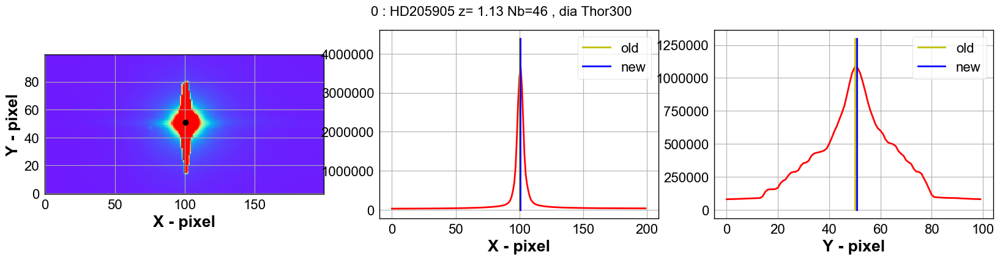

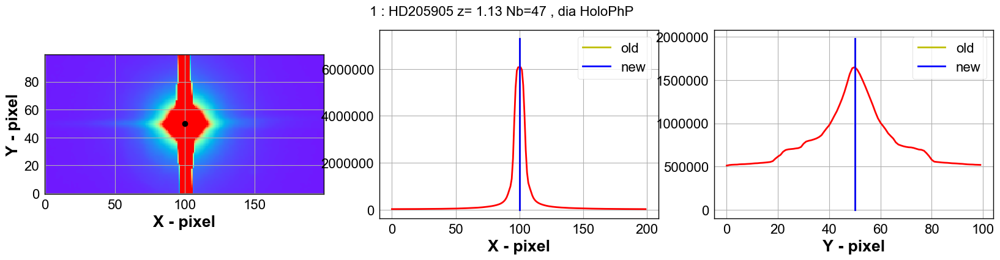

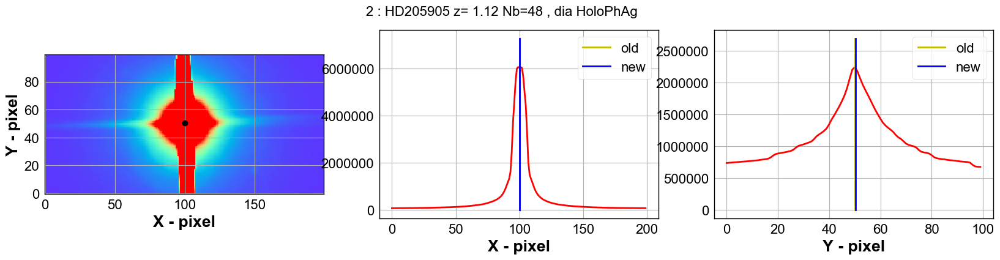

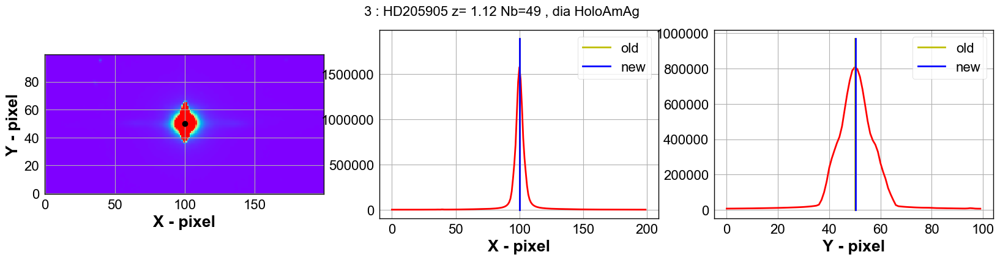

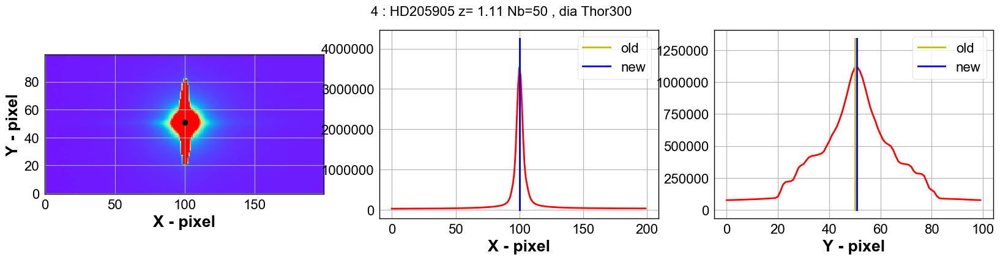

...

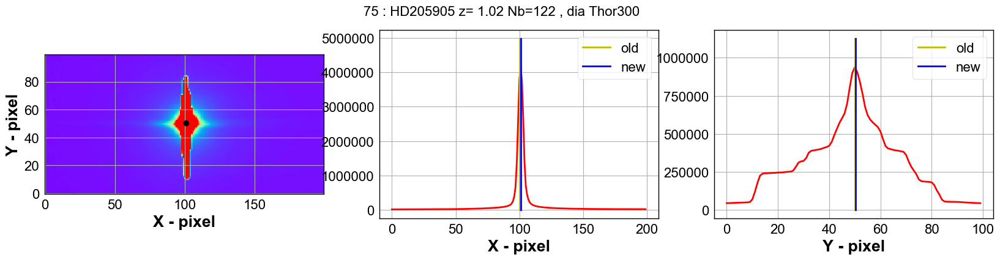

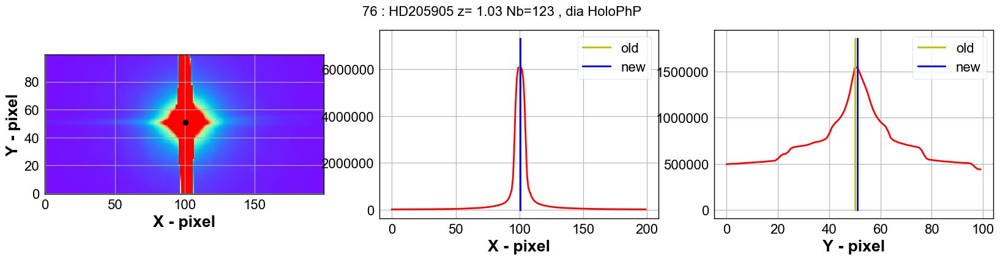

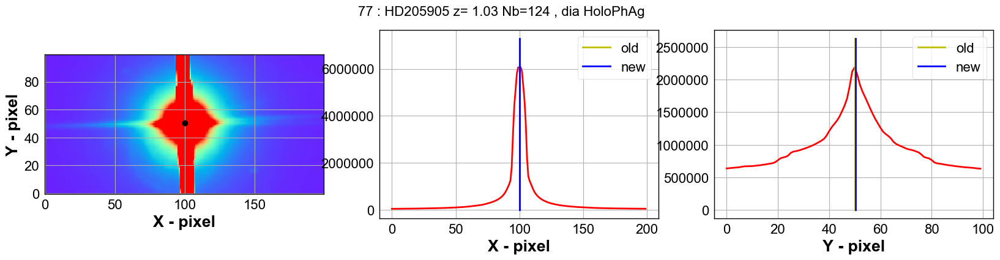

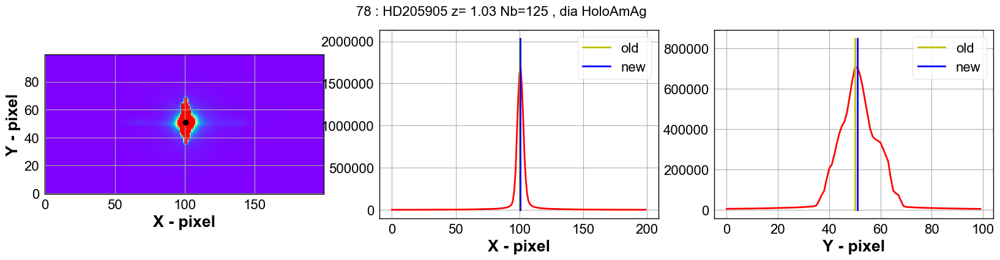

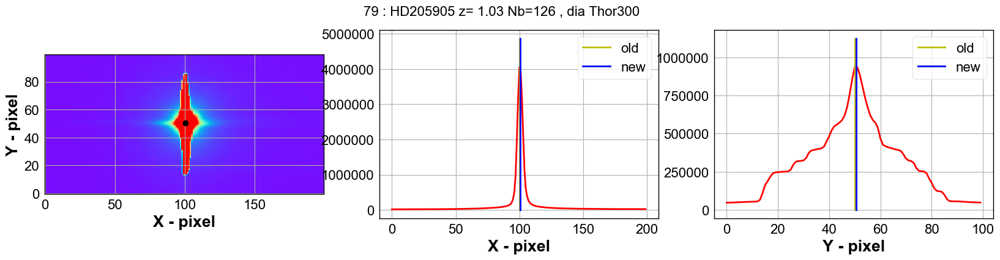

In [26]:
new_x_star,new_y_star=check_central_star(all_images,x_star2,y_star0,all_titles,all_filt)

## Zoom on the rotated image

In [27]:
# Right spectrum
#---------------
# start at star
#y_star0=[all_images[0].shape[0]/2]*len(all_images)
#x_star0=x_star

y_star0=new_y_star
x_star0=new_x_star

if ShowAllImageFirstOrderFlag:
    #ShowCenterImages([1300]*len(all_images),y_star0,[500]*len(all_images),[25]*len(all_images),
    #                all_images,all_titles,all_filt,object_name,NBIMGPERROW=2,vmin=0,vmax=10000)
    ShowCenterImages(x_star0+400,y_star0,[600]*len(all_images),[30]*len(all_images),
                 all_images,all_titles,all_filt,object_name,NBIMGPERROW=2,vmin=0,vmax=200,target_pos=np.array([new_x_star,new_y_star]).T)

    title='Right part of spectrum of {} '.format(object_name)
    plt.suptitle(title,size=16)
    figfilename=os.path.join(dir_top_images,'rightorder.pdf')
    plt.savefig(figfilename)  

In [28]:
# Left spectrum
#--------------
#y_star0=[all_images[0].shape[0]/2]*len(all_images)
#x_star0=x_star-600

y_star0=new_y_star
x_star0=new_x_star

if ShowAllImageFirstOrderFlag:
    #ShowCenterImages([110]*len(all_images),[60]*len(all_images),[500]*len(all_images),[30]*len(all_images),
    #                 all_images,all_titles,all_filt,object_name,NBIMGPERROW=2,vmin=0,vmax=10000)
    ShowCenterImages(x_star0-600,y_star0,[600]*len(all_images),[30]*len(all_images),
                 all_images,all_titles,all_filt,object_name,NBIMGPERROW=2,vmin=0,vmax=1000,target_pos=np.array([new_x_star,new_y_star]).T)
    title='Left part of spectrum of {} '.format(object_name)
    plt.suptitle(title,size=16)
    figfilename=os.path.join(dir_top_images,'leftorder.pdf')
    plt.savefig(figfilename)  

# Plot one contour

/Users/dagoret/anaconda/lib/python2.7/site-packages/matplotlib/contour.py:1518: UserWarning: Log scale: values of z <= 0 have been masked
  warnings.warn('Log scale: values of z <= 0 have been masked')


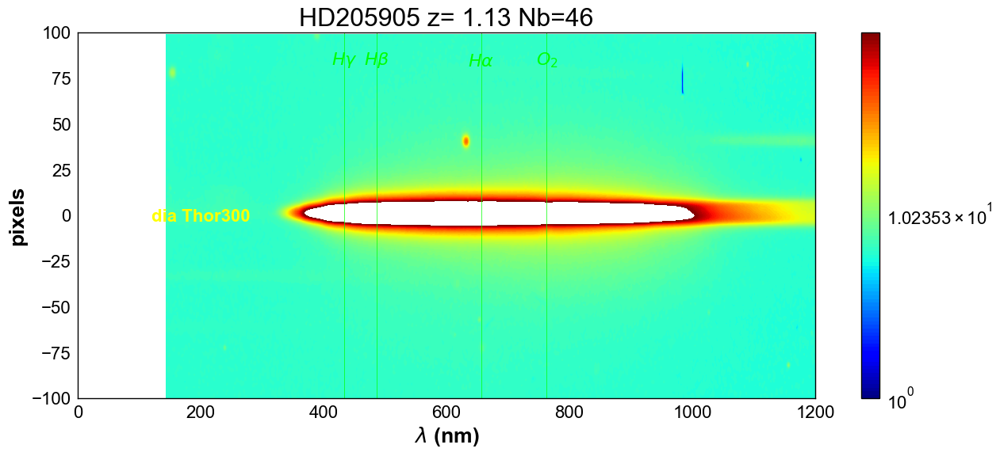

In [29]:
sel=0
ShowOneContourBKGLogScale(sel,all_images,order0_positions,x_star0,y_star0,all_titles,object_name,all_expo,dir_top_images,all_filt)

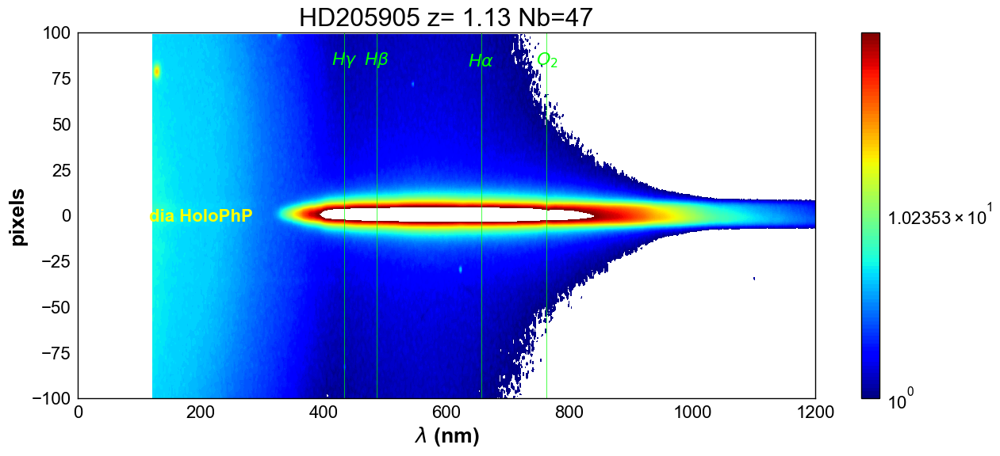

In [30]:
sel=1
ShowOneContourBKGLogScale(sel,all_images,order0_positions,x_star0,y_star0,all_titles,object_name,all_expo,dir_top_images,all_filt)

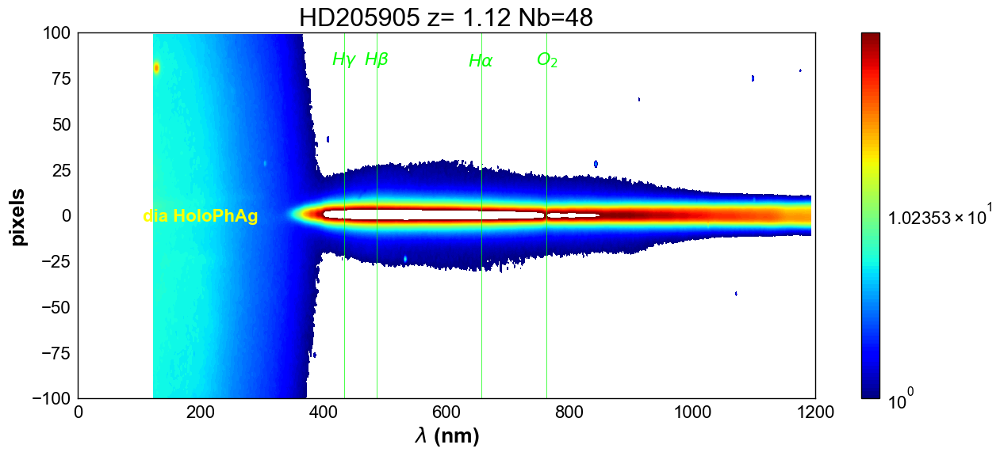

In [31]:
sel=2
ShowOneContourBKGLogScale(sel,all_images,order0_positions,x_star0,y_star0,all_titles,object_name,all_expo,dir_top_images,all_filt)

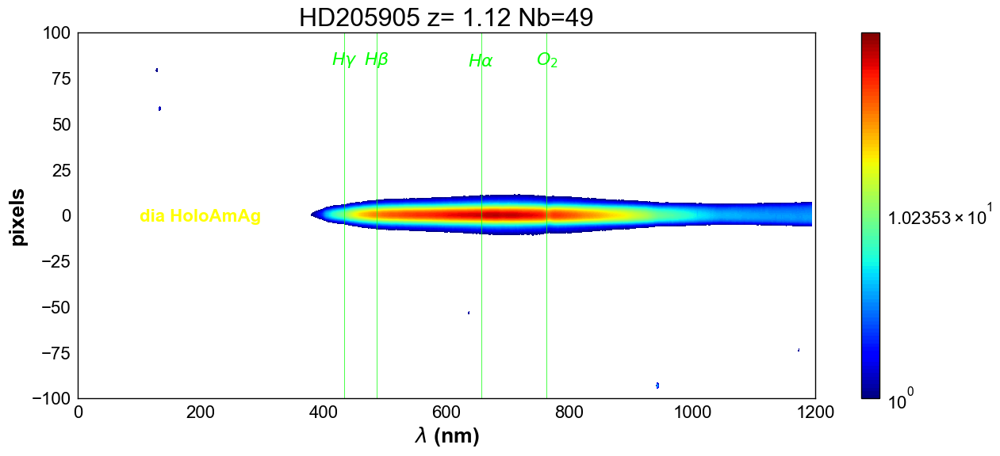

In [32]:
sel=3
ShowOneContourBKGLogScale(sel,all_images,order0_positions,x_star0,y_star0,all_titles,object_name,all_expo,dir_top_images,all_filt)

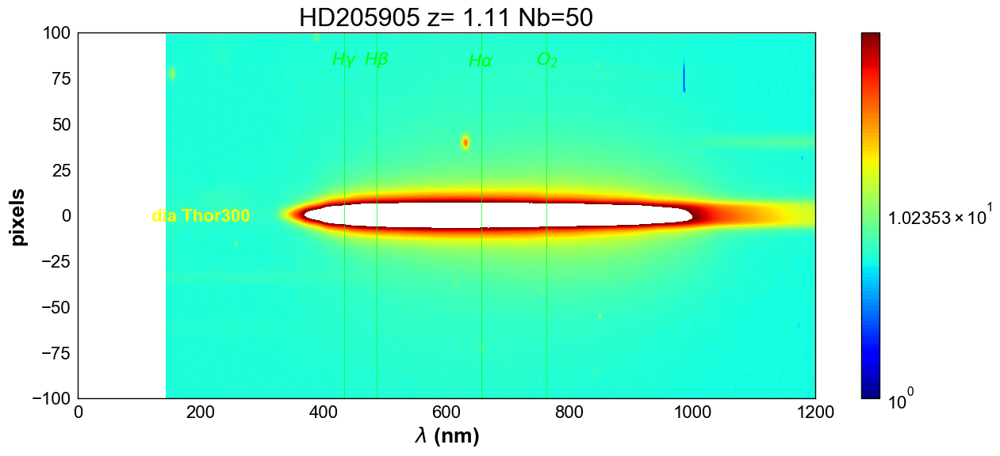

In [33]:
sel=4
ShowOneContourBKGLogScale(sel,all_images,order0_positions,x_star0,y_star0,all_titles,object_name,all_expo,dir_top_images,all_filt)

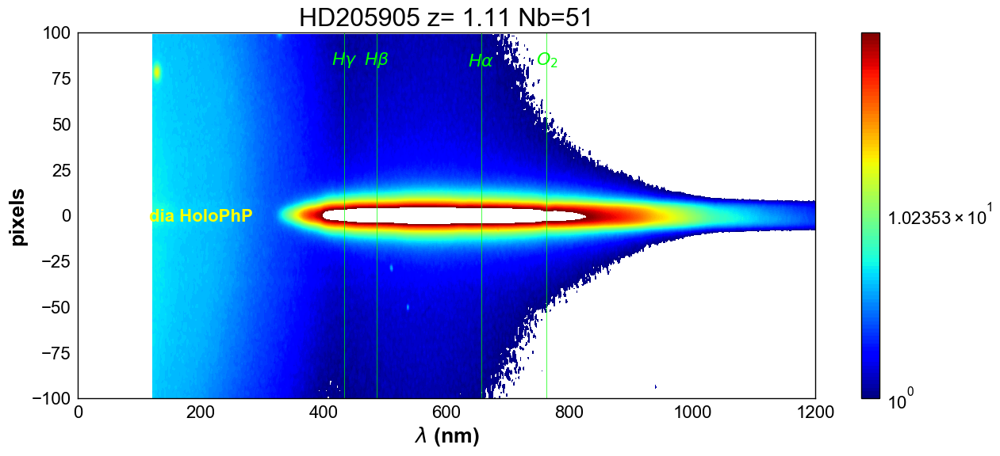

In [34]:
sel=5
ShowOneContourBKGLogScale(sel,all_images,order0_positions,x_star0,y_star0,all_titles,object_name,all_expo,dir_top_images,all_filt)

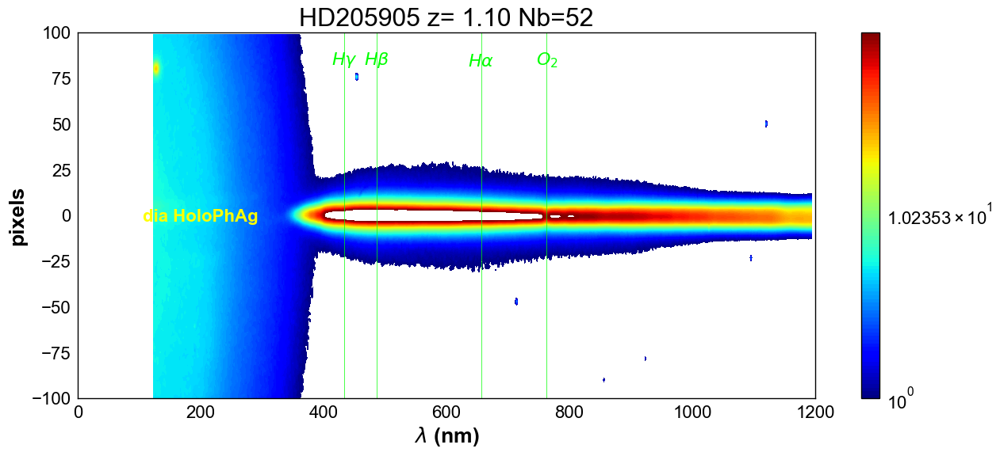

In [35]:
sel=6
ShowOneContourBKGLogScale(sel,all_images,order0_positions,x_star0,y_star0,all_titles,object_name,all_expo,dir_top_images,all_filt)

In [36]:
if 0:
    ShowOneOrder_contourBKGLogScale(all_images,order0_positions,x_star0,y_star0,all_titles,object_name,all_expo,dir_top_images,all_filt,'firstorderright_contour_logscale.pdf')

# Study more carefully the transverse spectrum shape

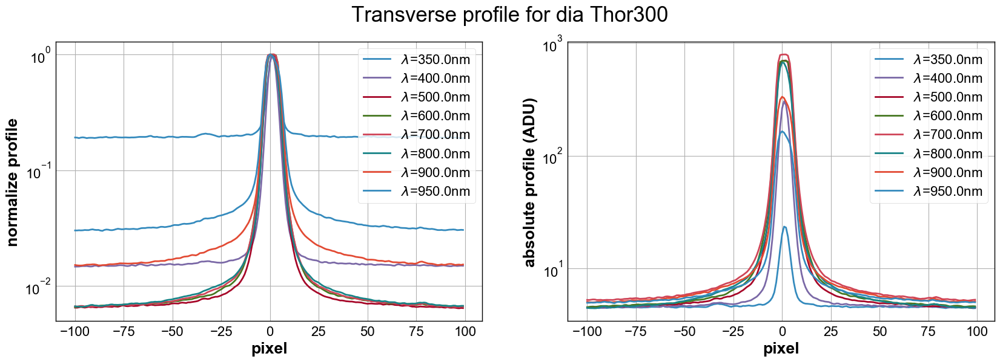

In [37]:
sel=0
ShowNarrowProfile(sel,all_images,order0_positions,x_star0,y_star0,all_titles,object_name,all_expo,dir_top_images,all_filt)

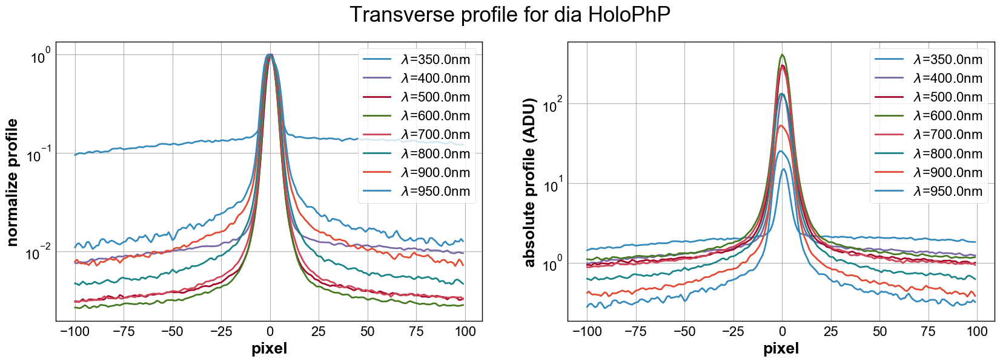

In [38]:
sel=1
ShowNarrowProfile(sel,all_images,order0_positions,x_star0,y_star0,all_titles,object_name,all_expo,dir_top_images,all_filt)

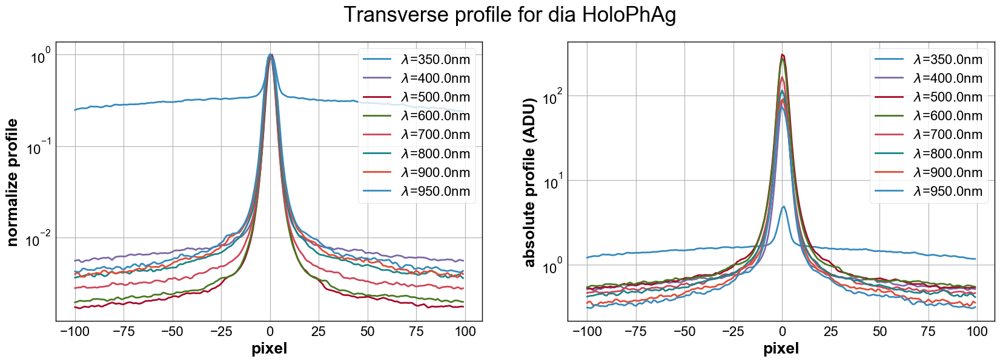

In [39]:
sel=2
ShowNarrowProfile(sel,all_images,order0_positions,x_star0,y_star0,all_titles,object_name,all_expo,dir_top_images,all_filt)

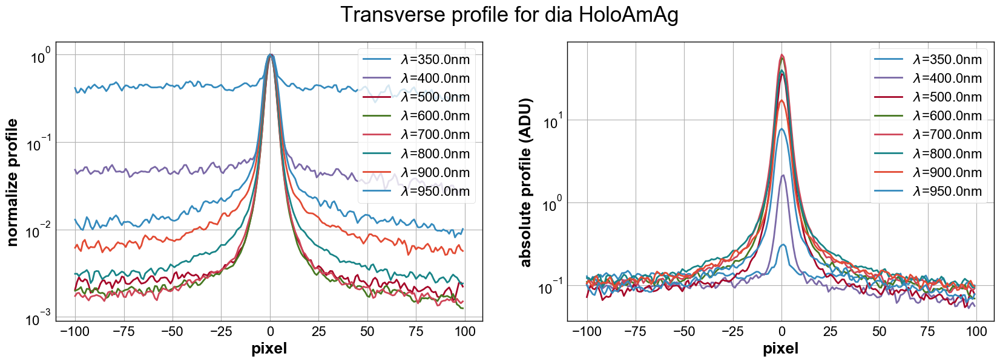

In [40]:
sel=3
ShowNarrowProfile(sel,all_images,order0_positions,x_star0,y_star0,all_titles,object_name,all_expo,dir_top_images,all_filt)

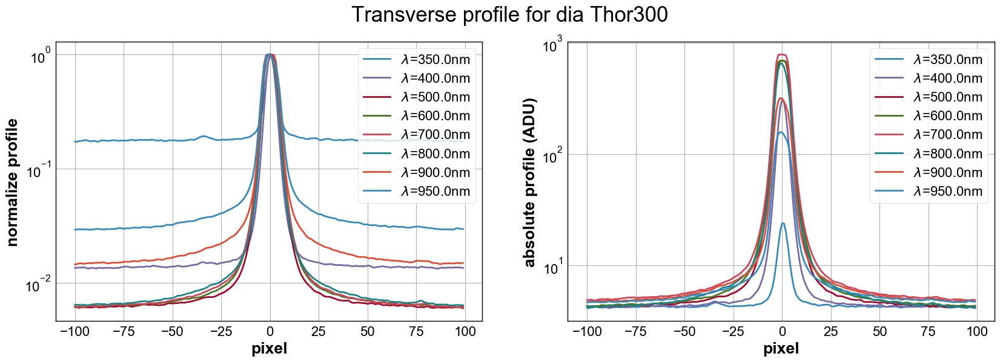

In [41]:
sel=4
ShowNarrowProfile(sel,all_images,order0_positions,x_star0,y_star0,all_titles,object_name,all_expo,dir_top_images,all_filt)

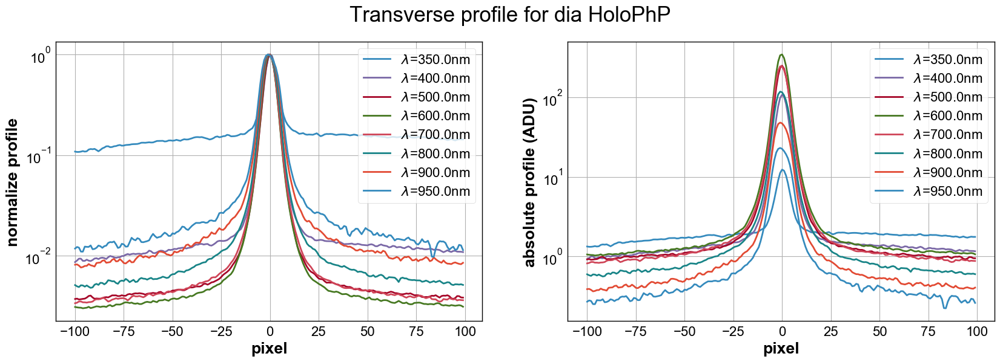

In [42]:
sel=5
ShowNarrowProfile(sel,all_images,order0_positions,x_star0,y_star0,all_titles,object_name,all_expo,dir_top_images,all_filt)

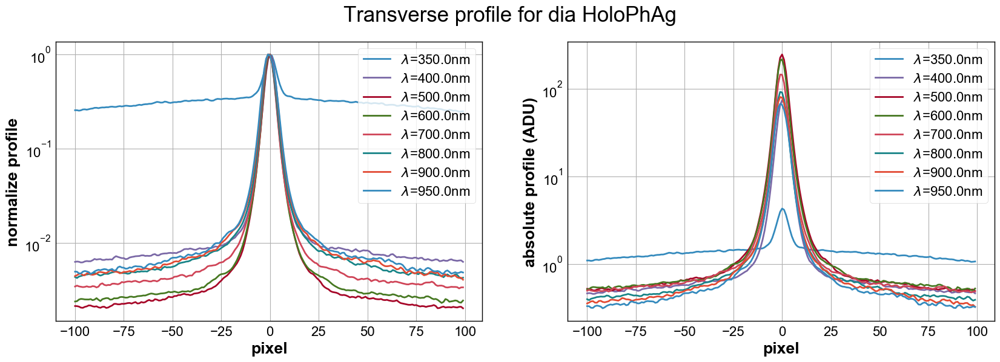

In [43]:
sel=6
ShowNarrowProfile(sel,all_images,order0_positions,x_star0,y_star0,all_titles,object_name,all_expo,dir_top_images,all_filt)

# Fit a Narrow Profile
=================================

## Extract the transverse profile

In [514]:
sel=5
thelambda=950.
thedlambda=50.

In [515]:
x,y=GetNarrowProfile(sel,all_images,order0_positions,x_star0,y_star0,thelambda,thedlambda,all_expo,all_filt)

In [516]:
themax_position=np.where(y==y.max())[0][0]
themin_position=np.where(y==y.min())[0][0]

In [517]:
themax=y[themax_position]
themin=y[themin_position]

## Compound fit with Background

### Define the model for the background 

- a linear model is used

In [518]:
#bkg_init=models.Linear1D(slope=0.01, intercept=themin)

In [519]:
bkg_init=models.Polynomial1D(degree=2)

### Defines a compount model with Moffat and do the fit

In [520]:
# Fit the data using a box model
mf_init = models.Moffat1D(amplitude=themax, x_0=0, gamma=10, alpha=1)+bkg_init
fitter_mf = fitting.SLSQPLSQFitter()
mf = fitter_mf(mf_init, x, y)

Iteration limit exceeded    (Exit mode 9)
            Current function value: 12.9874915398
            Iterations: 101
            Function evaluations: 956
            Gradient evaluations: 101


In [521]:
NBPARAM=len(mf.param_names)

In [522]:
print "MOFFAT Fit result :"
for idx in np.arange(NBPARAM):
    print mf.param_names[idx], ' :: ',mf.parameters[idx]

MOFFAT Fit result :
amplitude_0  ::  22.6177766979
x_0_0  ::  -0.256830982185
gamma_0  ::  63.5695539358
alpha_0  ::  125.300651049
c0_1  ::  0.601500786744
c1_1  ::  7.197023585e-06
c2_1  ::  -4.58351241926e-05


In [523]:
print (mf)

Model: CompoundModel2194
Inputs: (u'x',)
Outputs: (u'y',)
Model set size: 1
Expression: [0] + [1]
Components: 
    [0]: <Moffat1D(amplitude=22.857249928796836, x_0=0.0, gamma=10.0, alpha=1.0)>

    [1]: <Polynomial1D(2, c0=0.0, c1=0.0, c2=0.0)>
Parameters:
     amplitude_0       x_0_0      ...       c1_1             c2_1       
    ------------- --------------- ... --------------- ------------------
    22.6177766979 -0.256830982185 ... 7.197023585e-06 -4.58351241926e-05


### Defines a compount model with Gaussian and do the fit

In [524]:
# Fit the data using a Gaussian
g_init = models.Gaussian1D(amplitude=themax, mean=0, stddev=10.)+bkg_init
fitter_g = fitting.SLSQPLSQFitter()
g = fitter_g(g_init, x, y)

Optimization terminated successfully.    (Exit mode 0)
            Current function value: 12.9859574562
            Iterations: 17
            Function evaluations: 165
            Gradient evaluations: 17


In [525]:
NBPARAM=len(g.param_names)

In [526]:
print "Gaussian Fit result :"
for idx in np.arange(NBPARAM):
    print g.param_names[idx], ' :: ',g.parameters[idx]


Gaussian Fit result :
amplitude_0  ::  22.6009516278
mean_0  ::  -0.256254182577
stddev_0  ::  4.02594902517
c0_1  ::  0.604385552894
c1_1  ::  6.65278433165e-06
c2_1  ::  -4.63189460481e-05


In [527]:
print (g)

Model: CompoundModel2195
Inputs: (u'x',)
Outputs: (u'y',)
Model set size: 1
Expression: [0] + [1]
Components: 
    [0]: <Gaussian1D(amplitude=22.857249928796836, mean=0.0, stddev=10.0)>

    [1]: <Polynomial1D(2, c0=0.0, c1=0.0, c2=0.0)>
Parameters:
     amplitude_0       mean_0     ...        c1_1              c2_1       
    ------------- --------------- ... ----------------- ------------------
    22.6009516278 -0.256254182577 ... 6.65278433165e-06 -4.63189460481e-05


### Defines a compount model with Voigt and do the fit

In [528]:
# Fit the data using a box model
mv_init = models.Voigt1D(amplitude_L=themax, x_0=0)+bkg_init
fitter_mv = fitting.SLSQPLSQFitter()
v = fitter_mv(mv_init, x, y)

Optimization terminated successfully.    (Exit mode 0)
            Current function value: 11.6645648308
            Iterations: 75
            Function evaluations: 727
            Gradient evaluations: 75


In [529]:
print "Voigt Fit result :"
for idx in np.arange(NBPARAM):
    print v.param_names[idx], ' :: ',v.parameters[idx]

Voigt Fit result :
x_0_0  ::  -0.26219432214
amplitude_L_0  ::  129.641562817
fwhm_L_0  ::  1.18052312128
fwhm_G_0  ::  8.75301497408
c0_1  ::  0.491835792805
c1_1  ::  2.15744583101e-05


### Show the result

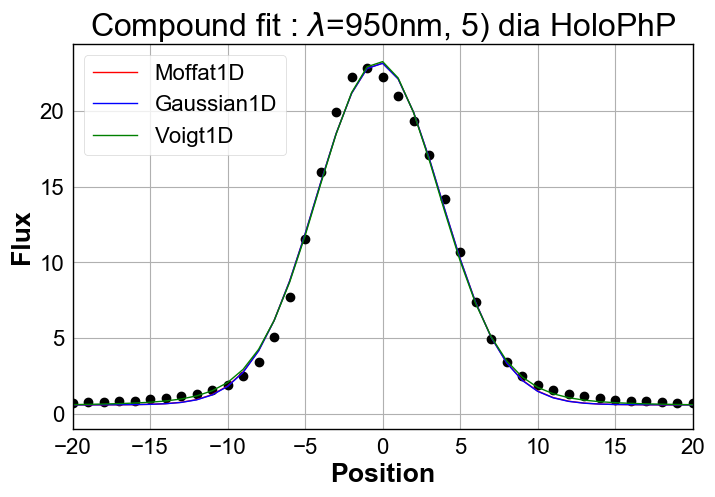

In [530]:
plt.figure(figsize=(8,5))
plt.plot(x, y, 'ko')
plt.plot(x, mf(x),'r-' ,label='Moffat1D')
plt.plot(x, g(x),'b-' ,label='Gaussian1D')
plt.plot(x, v(x),'g-' ,label='Voigt1D')
plt.xlabel('Position')
plt.ylabel('Flux')
plt.legend(loc=2)
thetitle='Compound fit : $\lambda$={}nm, {}) {}'.format(int(thelambda),sel,all_filt[sel])
plt.xlim(-20.,20.)
plt.title(thetitle)
figname='FitMoffatGauss_{}_{}nm_{}.pdf'.format(sel,int(thelambda),all_filt2[sel])
figfilename=os.path.join(dir_top_images,figname)
plt.savefig(figfilename)

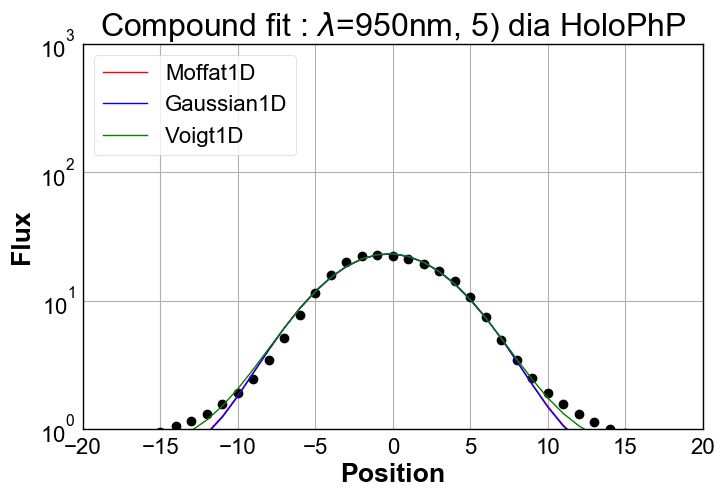

In [531]:
plt.figure(figsize=(8,5))
plt.semilogy(x, y, 'ko')
plt.semilogy(x, mf(x),'r-' ,label='Moffat1D')
plt.semilogy(x, g(x),'b-' ,label='Gaussian1D')
plt.semilogy(x, v(x),'g-' ,label='Voigt1D')
plt.xlabel('Position')
plt.ylabel('Flux')
plt.legend(loc=2)
thetitle='Compound fit : $\lambda$={}nm, {}) {}'.format(int(thelambda),sel,all_filt[sel])
plt.xlim(-20.,20.)
plt.title(thetitle)
figname='FitMoffatGaussLog_{}_{}nm_{}.pdf'.format(sel,int(thelambda),all_filt2[sel])
figfilename=os.path.join(dir_top_images,figname)
plt.ylim(1.,1e3)
plt.savefig(figfilename)

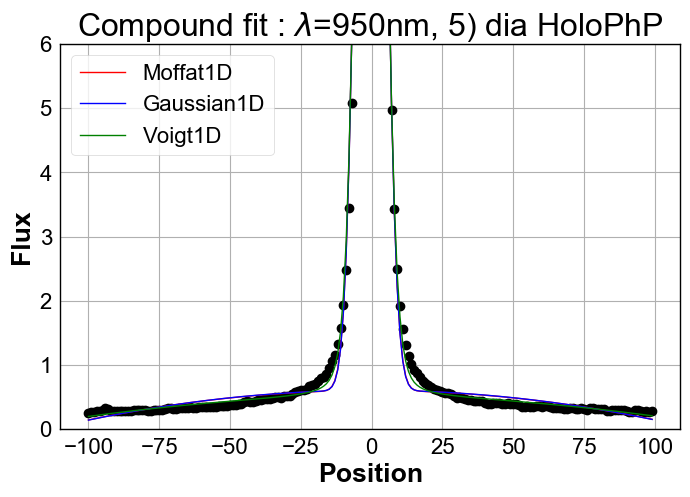

In [532]:
plt.figure(figsize=(8,5))
plt.plot(x, y, 'ko')
plt.plot(x, mf(x),'r-' ,label='Moffat1D')
plt.plot(x, g(x),'b-' ,label='Gaussian1D')
plt.plot(x, v(x),'g-' ,label='Voigt1D')
plt.xlabel('Position')
plt.ylabel('Flux')
plt.legend(loc=2)
plt.ylim(0.,6.)
thetitle='Compound fit : $\lambda$={}nm, {}) {}'.format(int(thelambda),sel,all_filt[sel])
plt.title(thetitle)
figname='FitMoffatGauss2_{}_{}nm_{}.pdf'.format(sel,int(thelambda),all_filt2[sel])
figfilename=os.path.join(dir_top_images,figname)
plt.savefig(figfilename)

# Fit with scipy

In [533]:
if 0:
    all_amplitude_0, \
    all_x_0_0, \
    all_gamma_0, \
    all_alpha_0, \
    all_slope_1, \
    all_intercept_1, \
    all_fit_flag, \
    all_lambdas=GetMoffatAmplitude(sel,all_images,order0_positions,x_star0,y_star0,all_expo,all_filt)

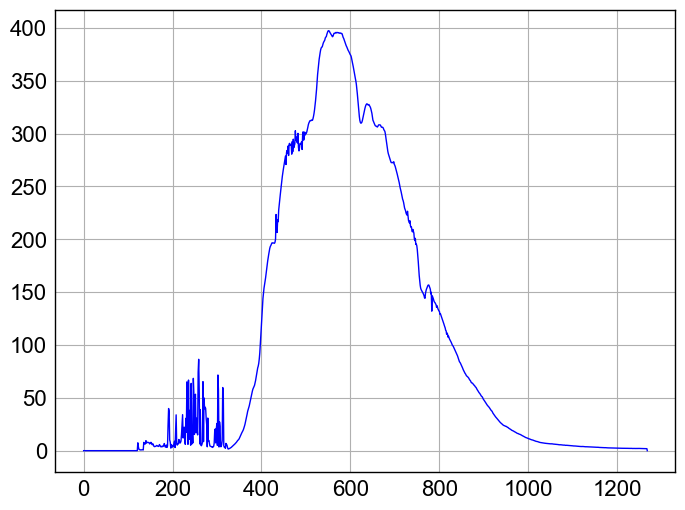

In [534]:
plt.figure(figsize=(8,6))
plt.plot(all_lambdas,all_amplitude_0,'b-')

In [535]:
if 0:
    ShowMoffatAmplitude(sel,all_images,order0_positions,x_star0,y_star0,all_expo,dir_top_images,all_filt)